In [1]:
import time
import datetime
start = time.time()

In [2]:
# Load required tools. 'as' shorthands tools name for convenience.
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import glob
import seaborn as sns
import bbknn
from pandas.core.index import RangeIndex
from matplotlib import rcParams
from matplotlib.pyplot import rc_context

/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  if __name__ == '__main__':


In [3]:
sc.settings.verbosity = 3   
sc.logging.print_header() 
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.2


In [4]:
!pwd

/home/harris/VE2hrAmpIsth


In [5]:
VE2AmIs = sc.read( './VE2AmIs.h5ad') 

# Loading the data file or previously saved file as 'adata'. Does not have to be called adata can be named anything.
VE2AmIs = sc.read( './VE2AmIs.h5ad') 

In [6]:
VE2AmIs.var_names_make_unique()

In [7]:
VE2AmIs

AnnData object with n_obs × n_vars = 25930 × 31253
    obs: 'Clusters', '_X', '_Y', 'Region', 'Treatment'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

normalizing counts per cell
    finished (0:00:00)


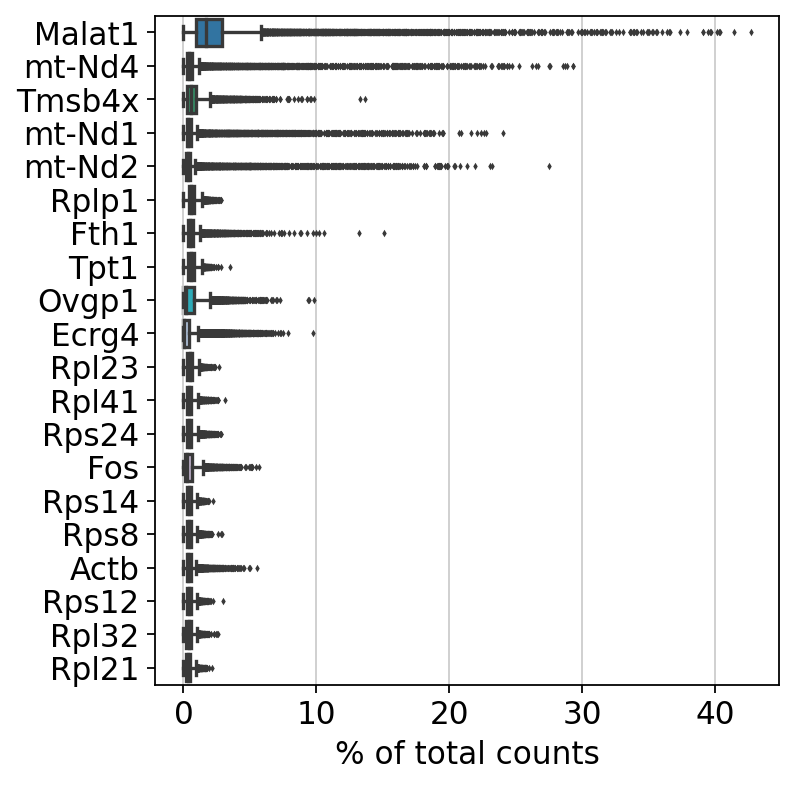

In [8]:
sc.pl.highest_expr_genes(VE2AmIs, n_top=20)

In [9]:
sc.pp.filter_cells(VE2AmIs, min_genes=200) 
sc.pp.filter_genes(VE2AmIs, min_cells=3)

filtered out 447 cells that have less than 200 genes expressed
filtered out 10997 genes that are detected in less than 3 cells


In [10]:
mito_genes = VE2AmIs.var_names.str.startswith('mt') 
VE2AmIs.obs['pct_counts_mt'] = np.sum(
    VE2AmIs[:, mito_genes].X, axis=1).A1 / np.sum(VE2AmIs.X, axis=1).A1 
VE2AmIs.obs['total_counts'] = VE2AmIs.X.sum(axis=1).A1 

In [11]:
VE2AmIs

AnnData object with n_obs × n_vars = 25483 × 20256
    obs: 'Clusters', '_X', '_Y', 'Region', 'Treatment', 'n_genes', 'pct_counts_mt', 'total_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

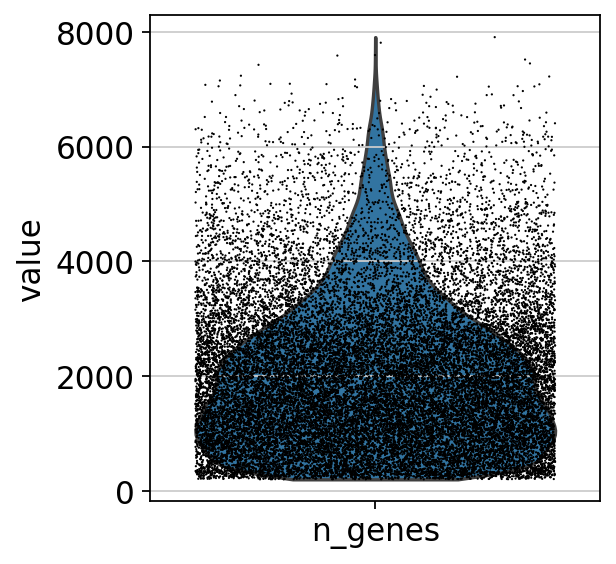

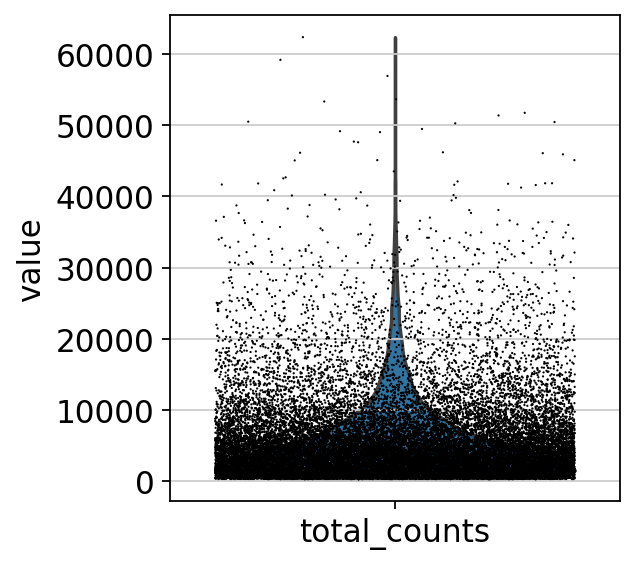

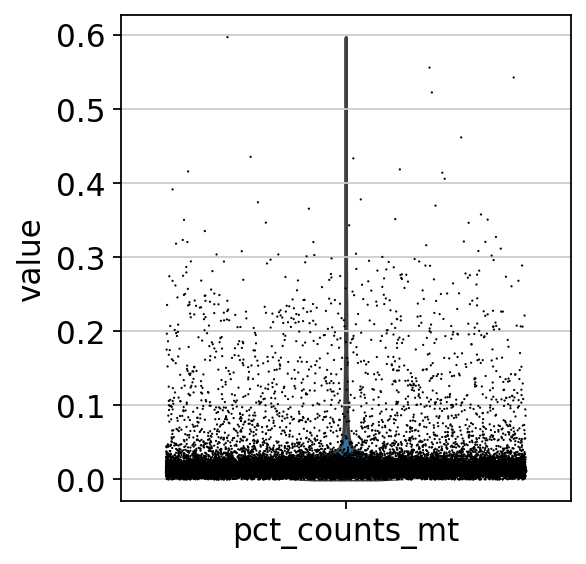

In [12]:
sc.pl.violin(VE2AmIs, ['n_genes'], jitter=0.4)
sc.pl.violin(VE2AmIs, ['total_counts'], jitter=0.4)
sc.pl.violin(VE2AmIs, ['pct_counts_mt'], jitter=0.4)

In [13]:
VE2AmIs

AnnData object with n_obs × n_vars = 25483 × 20256
    obs: 'Clusters', '_X', '_Y', 'Region', 'Treatment', 'n_genes', 'pct_counts_mt', 'total_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

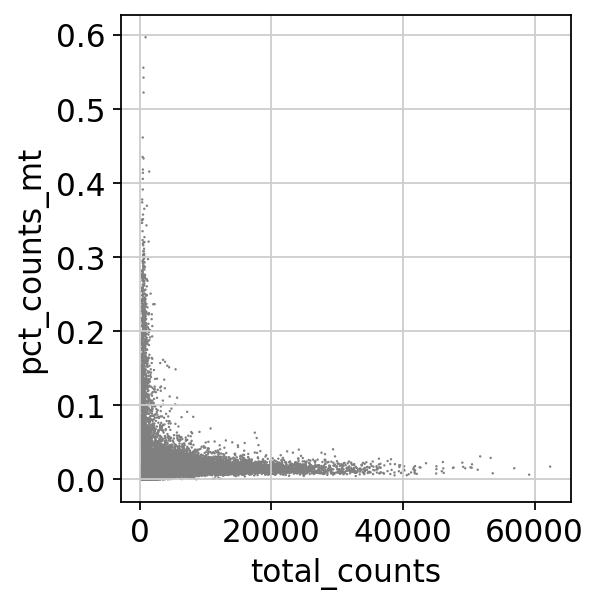

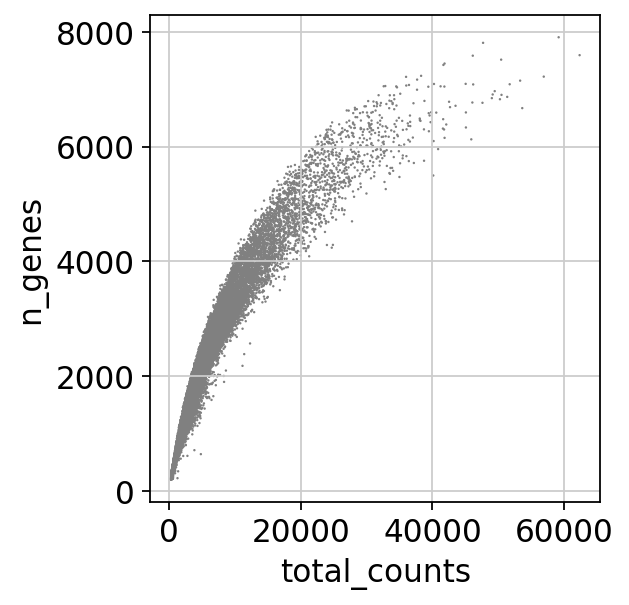

In [14]:
sc.pl.scatter(VE2AmIs, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(VE2AmIs, x='total_counts', y='n_genes')

In [15]:
VE2AmIs

AnnData object with n_obs × n_vars = 25483 × 20256
    obs: 'Clusters', '_X', '_Y', 'Region', 'Treatment', 'n_genes', 'pct_counts_mt', 'total_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [16]:
VE2AmIs = VE2AmIs[VE2AmIs.obs.n_genes < 6000, :]
VE2AmIs = VE2AmIs[VE2AmIs.obs.pct_counts_mt < 0.05, :]

In [17]:
sc.pp.normalize_total(VE2AmIs, target_sum=None)

/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [18]:
sc.pp.log1p(VE2AmIs)

In [19]:
sc.pp.regress_out(VE2AmIs, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:05:35)


In [20]:
sc.pp.highly_variable_genes(VE2AmIs, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


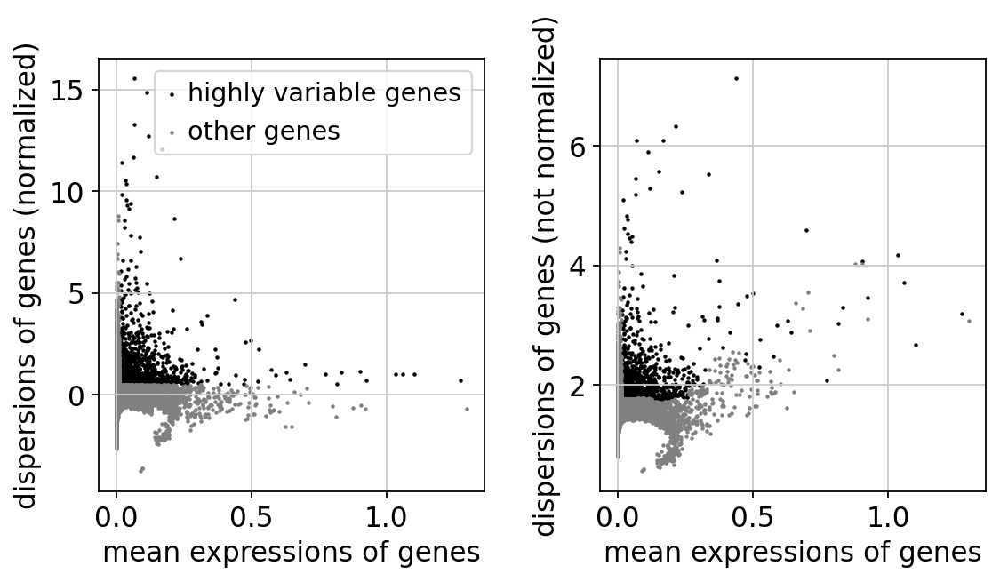

In [21]:
sc.pl.highly_variable_genes(VE2AmIs)

In [22]:
VE2AmIs.raw = VE2AmIs

In [23]:
VE2AmIs = VE2AmIs[:, VE2AmIs.var.highly_variable]

In [24]:
VE2AmIs.write('./CheckPoint.h5ad')
CheckPoint = sc.read('./CheckPoint.h5ad')

In [25]:
sc.pp.scale(VE2AmIs, max_value=10) 

/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [26]:
sc.tl.pca(VE2AmIs, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


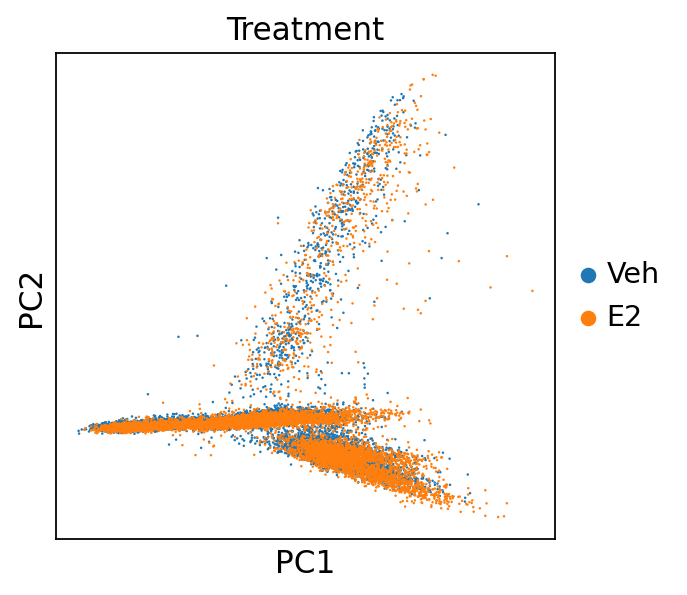

In [27]:
sc.pl.pca(VE2AmIs, color='Treatment')

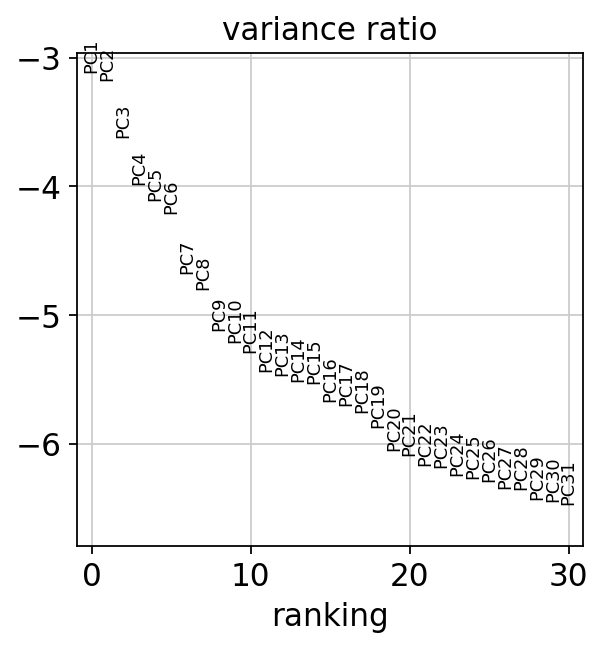

In [28]:
sc.pl.pca_variance_ratio(VE2AmIs, log=True)

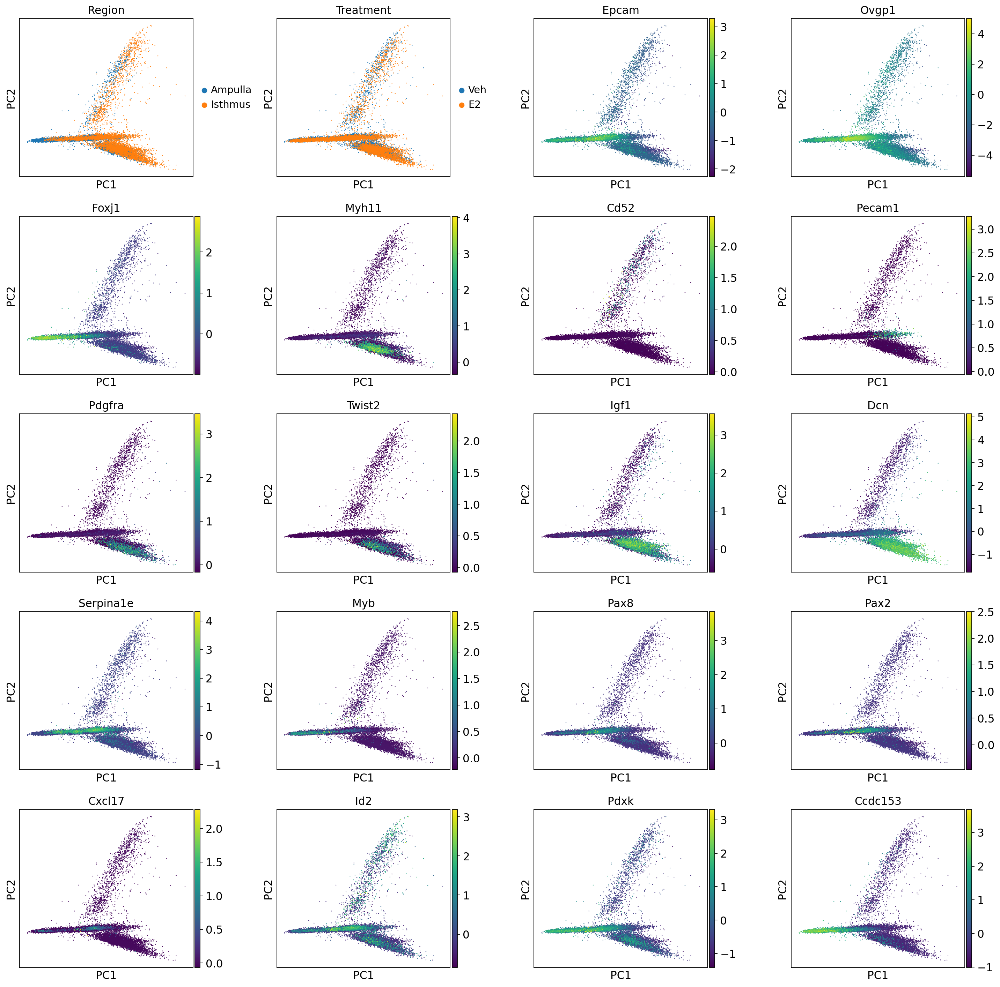

In [29]:
sc.pl.pca(VE2AmIs, wspace=0.35,
          color=['Region', 'Treatment', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1', 
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pax2', 'Cxcl17', 'Id2', 'Pdxk', 'Ccdc153'])

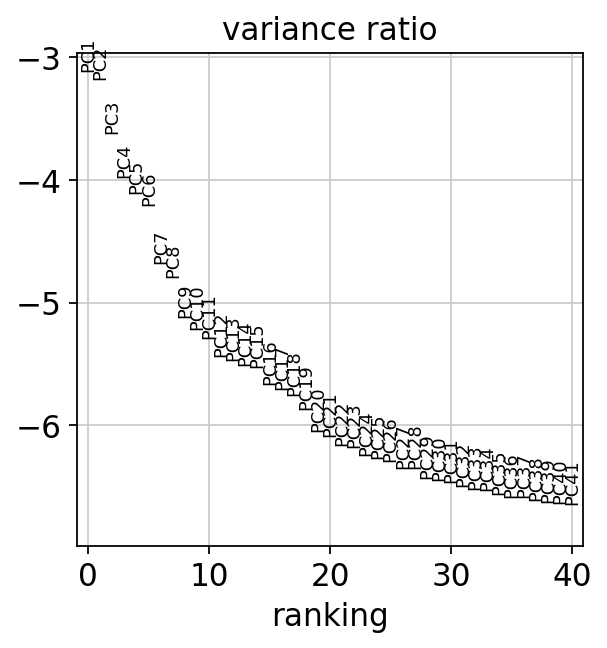

In [30]:
sc.pl.pca_variance_ratio(VE2AmIs, n_pcs=40, log=True)

In [31]:
VE2AmIs

AnnData object with n_obs × n_vars = 23771 × 1465
    obs: 'Clusters', '_X', '_Y', 'Region', 'Treatment', 'n_genes', 'pct_counts_mt', 'total_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'Treatment_colors', 'Region_colors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [32]:
sc.pp.neighbors(VE2AmIs, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


In [33]:
sc.tl.leiden(VE2AmIs)
sc.tl.paga(VE2AmIs)
sc.pl.paga(VE2AmIs, plot=False)  
sc.tl.umap(VE2AmIs, init_pos='paga')

running Leiden clustering
    finished: found 28 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:01)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


In [34]:
sc.tl.umap(VE2AmIs)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


In [35]:
sc.tl.leiden(VE2AmIs, resolution=0.2) 

running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


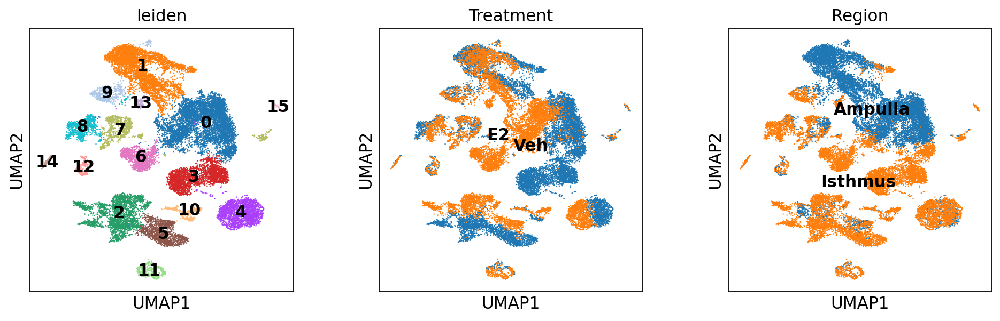

In [36]:
sc.pl.umap(VE2AmIs,color=['leiden','Treatment', 'Region'],legend_loc='on data')

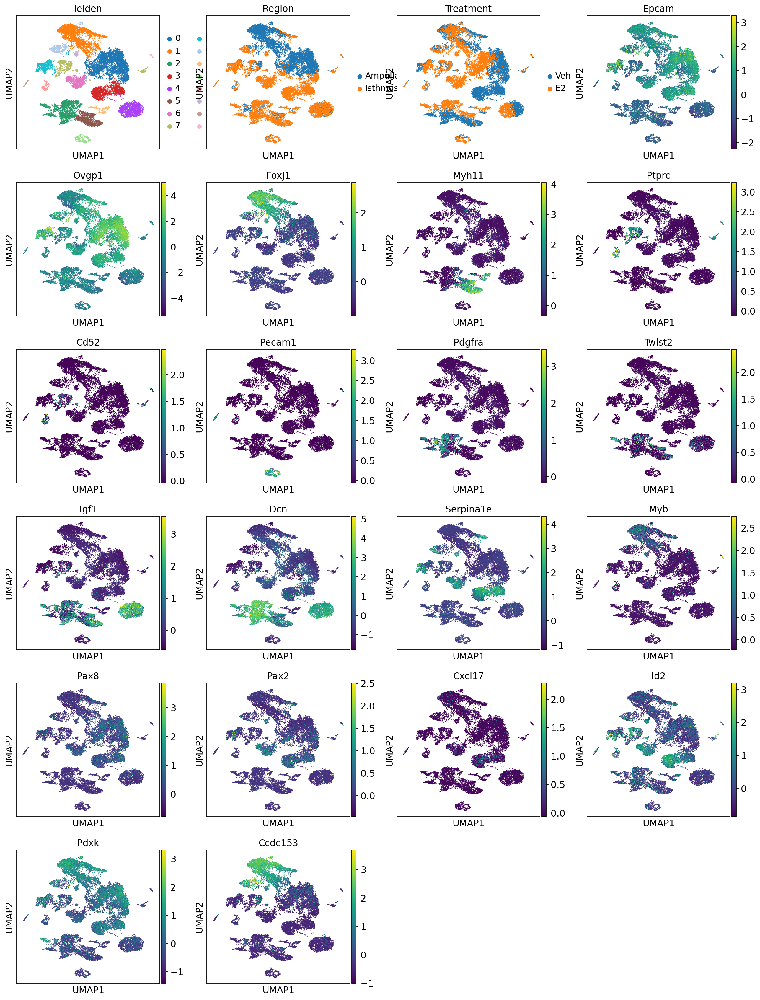

In [37]:
sc.pl.umap(VE2AmIs,
           color=['leiden', 'Region', 'Treatment', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Ptprc', 'Cd52', 'Pecam1', 
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pax2', 'Cxcl17', 'Id2', 'Pdxk', 'Ccdc153'])

In [38]:
VE2AmIs.obs.groupby(["leiden","Treatment","Region"]).apply(len)

leiden  Treatment  Region 
0       Veh        Ampulla    2983
                   Isthmus     423
        E2         Ampulla    2343
                   Isthmus     298
1       Veh        Ampulla    2368
                   Isthmus     165
        E2         Ampulla    1815
                   Isthmus      26
2       Veh        Ampulla     143
                   Isthmus    1225
        E2         Ampulla     261
                   Isthmus    1021
3       Veh        Ampulla      18
                   Isthmus    2452
        E2         Isthmus       2
4       Veh        Ampulla     286
                   Isthmus     781
        E2         Ampulla     156
                   Isthmus     796
5       Veh        Ampulla      53
                   Isthmus     932
        E2         Ampulla     210
                   Isthmus     191
6       E2         Ampulla      11
                   Isthmus    1133
7       Veh        Ampulla     140
                   Isthmus     324
        E2         Ampulla  

In [39]:
VE2AmIs_AllPops = VE2AmIs[VE2AmIs.obs['leiden'].isin(
     ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13'])]

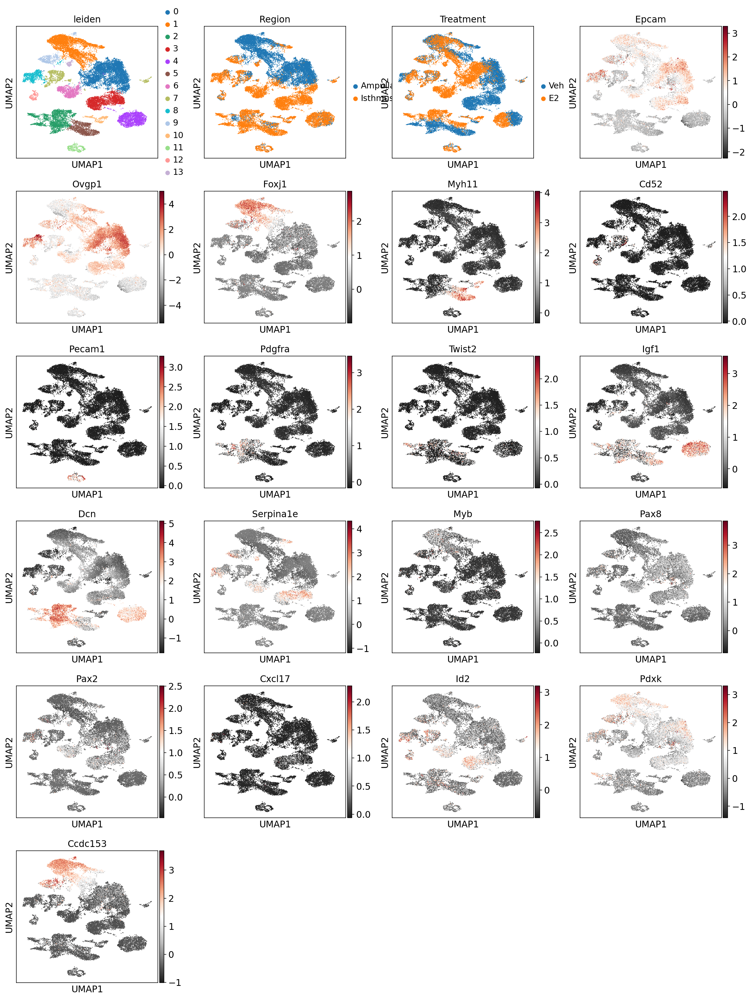

In [40]:
sc.pl.umap(VE2AmIs_AllPops, color_map='RdGy_r',
           color=['leiden', 'Region', 'Treatment', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1', 
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pax2', 'Cxcl17', 'Id2', 'Pdxk', 'Ccdc153'])

In [41]:
VE2AmIs_AllPops
# now you will see that 'neighbors', 'umap', 'leiden', 'leiden_colors' are added in this dataset

View of AnnData object with n_obs × n_vars = 23590 × 1465
    obs: 'Clusters', '_X', '_Y', 'Region', 'Treatment', 'n_genes', 'pct_counts_mt', 'total_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'Treatment_colors', 'Region_colors', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [42]:
VE2AmIs_AllPops.write('./VE2AmIs_AllPops.h5ad')